<div style="width: 100%; clear: both;">
<div style="float: left; width: 50%;">
<img src="http://www.uoc.edu/portal/_resources/common/imatges/marca_UOC/UOC_Masterbrand.jpg", align="left">
</div>
<div style="float: right; width: 50%;">
<p style="margin: 0; padding-top: 22px; text-align:right;">M2.855 · Modelos avanzados de minería de datos</p>
<p style="margin: 0; text-align:right;">2022-2 · Máster universitario en Ciencia de datos (Data science)</p>
<p style="margin: 0; text-align:right; padding-button: 100px;">Estudios de Informática, Multimedia y Telecomunicación</p>
</div>
</div>
<div style="width:100%;">&nbsp;</div>

# PEC 2: Métodos no supervisados

A lo largo de esta práctica veremos como aplicar distintas técnicas no supervisadas, así como algunas de sus aplicaciones reales:

 - **[Clustering con distintas estrategias](#ej1)**: k-means y regla del codo, basadas en densidad y jerárquicas.
 - **[Aplicación para comprimir imágenes](#ej2)**: clustering y análisis.
 - **[Aplicación de reducción de dimensionalidad para resolver un problema de optimización](#ej3)**: t-SNE.

<u>Consideraciones generales</u>: 

- La solución planteada no puede utilizar métodos, funciones o parámetros declarados **_deprecated_** en futuras versiones, a excepción de que se indique explícitamente.
- Esta PEC debe realizarse de forma **estrictamente individual**. Cualquier indicio de copia será penalizado con un suspenso (D) para todas las partes implicadas y la posible evaluación negativa de la asignatura de forma íntegra.
- Es necesario que el estudiante indique **todas las fuentes** que ha utilizado para la realización de la PEC. De no ser así, se considerará que el estudiante ha cometido plagio, siendo penalizado con un suspenso (D) y la posible evaluación negativa de la asignatura de forma íntegra.

<u>Formato de la entrega</u>:

- Algunos ejercicios pueden suponer varios minutos de ejecución, por lo que la entrega debe hacerse en **formato notebook** y en **formato html**, donde se vea el código, los resultados y comentarios de cada ejercicio. Se puede exportar el notebook a HTML desde el menú File $\to$ Download as $\to$ HTML.
- Existe un tipo de celda especial para albergar texto. Este tipo de celda os será muy útil para responder a las diferentes preguntas teóricas planteadas a lo largo de la actividad. Para cambiar el tipo de celda a este tipo, en el menú: Cell $\to$ Cell Type $\to$ Markdown.

<div class="alert alert-block alert-info">
<strong>Nombre y apellidos: EDUARDO MORA GONZÁLEZ</strong>
</div>

Iniciamos la activdad con la carga de las siguientes librerías:

In [266]:
import random

import matplotlib
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import sklearn
from sklearn import cluster        # Algoritmos de clustering.
from sklearn import datasets       # Crear datasets.
from sklearn.cluster import KMeans
from scipy.cluster.hierarchy import linkage, dendrogram, cut_tree
from scipy.spatial.distance import pdist
from sklearn.manifold import TSNE

%matplotlib inline

<a id="ej1"></a>

## 1. Métodos de *clustering* (5 puntos)

Este ejercicio trata de explorar distintas técnicas de agrupamiento, ajustándolas a distintos conjuntos de datos.

El objetivo es doble: 
- entender la influencia de los parámetros en su comportamiento, 
- y conocer sus limitaciones en la búsqueda de estructuras de datos.

### Generación de los conjuntos de datos

In [267]:
X_blobs, y_blobs = datasets.make_blobs(n_samples=1000, n_features=2, centers=4, cluster_std=1.6, random_state=42)
X_moons, y_moons = datasets.make_moons(n_samples=1000, noise=.07, random_state=42)
X_circles, y_circles = datasets.make_circles(n_samples=1000, factor=.5, noise=.05, random_state=42)

Cada dataset tiene 2 variables: una variable *X* que contiene 2 features (columnas) y tantas filas como muestras. Y una variable *y* que alberga las etiquetas que identifican cada cluster.

A lo largo del ejercicio no se usará la variable *y* (sólo con el objetivo de visualizar). El objetivo es encontrar las estructuras descritas por las variables *y* a través de los distintos modelos de *clustering* conseguir.

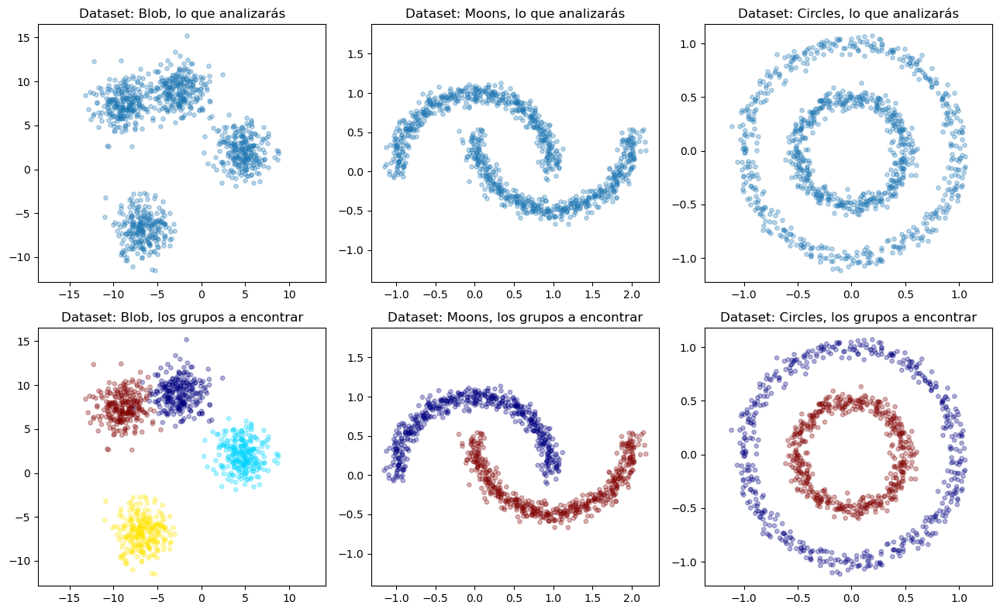

In [268]:
fig, axis = plt.subplots(2, 3, figsize=(13, 8))
for i, (X, y, ax, name) in enumerate(zip([X_blobs, X_moons, X_circles] * 2,
                                         [None] * 3 + [y_blobs, y_moons, y_circles],
                                         axis.reshape(-1),
                                         ['Blob', 'Moons', 'Circles'] * 2)):
    ax.set_title('Dataset: {}, '.format(name) + ('lo que analizarás' if i < 3 else 'los grupos a encontrar'))
    ax.scatter(X[:,0], X[:,1], s=15, c=y, alpha=.3, cmap='jet')
    ax.axis('equal')
plt.tight_layout()

### 1 a. K-means

En este apartado se pide probar el algoritmo *k-means* sobre los tres datasets presentados anteriormente ajustando con los parámetros adecuados y analizar sus resultados.

In [269]:
X, y = X_blobs, y_blobs

Para estimar el número de clusters a detectar por *k-means*. Una técnica para estimar $k$ es, como se explica en la teoría:
> Los criterios anteriores (minimización de distancias intra grupo o maximización de distancias inter grupo) pueden usarse para establecer un valor adecuado para el parámetro k. Valores k para los que ya no se consiguen mejoras significativas en la homogeneidad interna de los segmentos o la heterogeneidad entre segmentos distintos, deberían descartarse.

Lo que popularmente se conocer como *regla del codo*.

Primero es necesario calcular la suma de los errores cuadráticos ([*SSE*](https://bl.ocks.org/rpgove/0060ff3b656618e9136b)) que consiste en la suma de todos los errores (distancia de cada punto a su centroide asignado) al cuadrado.

$$SSE = \sum_{i=1}^{K} \sum_{x \in C_i} euclidean(x, c_i)^2$$

Donde $K$ es el número de clusters a buscar por *k-means*, $x \in C_i$ son los puntos que pertenecen a i-ésimo cluster, $c_i$ es el centroide del cluster $C_i$ (al que pertenece el punto $x$), y $euclidean$ es la [distancia euclídea](https://en.wikipedia.org/wiki/Euclidean_distance).

Este procedimiento realizado para cada posible valor $k$, resulta en una función monótona decreciente, donde el eje $x$ representa los distintos valores de $k$, y el eje $y$ el $SSE$. Intuitivamente se podrá observar un significativo descenso del error, que indicará el valor idóneo de $k$.

**Se pide realizar la representación gráfica de la regla del codo junto a su interpretación, utilizando la librería ```matplotlib``` y la implementación en scikit-learn de [*k-means*](http://scikit-learn.org/stable/modules/generated/sklearn.cluster.KMeans.html).**

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Blobs.
</div>

In [270]:
def regla_codo(datos):
    # Calcular SSE para cada valor de k
    sse = {}
    for k in range(1, 11):
        kmeans = cluster.KMeans(n_clusters=k).fit(X)
        sse[k] = kmeans.inertia_

    # Visualizar curva del codo
    plt.figure()
    plt.plot(list(sse.keys()), list(sse.values()))
    plt.xlabel("Número de Clusters")
    plt.ylabel("SSE")
    plt.title("Curva de Elbow")
    plt.show()  

C:\Users\eduar\miniconda3\envs\uoc20222pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


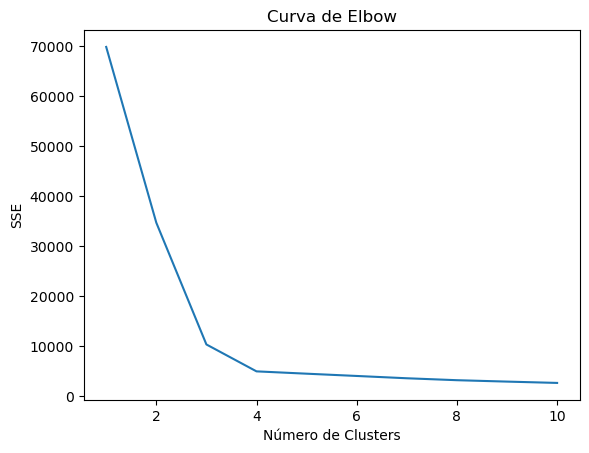

In [271]:
regla_codo(X)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿qué se interpreta en la gráfica?, ¿Cómo podría mejorarse la elección de $k$?
</div>

La gráfica representa la suma de los errores cuadrados (SSE) para cada valor de k en el rango de 1 a 10. El SSE es una medida de cuánto se separan los puntos de cada centroide en un modelo de KMeans. Como se puede ver en la gráfica, el SSE disminuye a medida que aumenta el número de clusters. Sin embargo, después de k = 4, la disminución en el SSE es menos pronunciada. Esto sugiere que k = 4 es un buen valor para el número de clusters. 

El punto en el que la curva se dobla se conoce como el "codo", que indica el punto donde la ganancia marginal en la reducción del SSE disminuye significativamente. En este caso, el codo se encuentra en k = 4.

Otra manera de abordar la elección de K sería ajustando el valor de K durante la ejecución del algoritmo. Se empieza con un valor y se va modificando durante el proceso, dependiendo de si hay particiones muy cercanas (fusión) o un grupo con alta densidad de elementos (división).

Para mejorar la elección de K, se podría modificar la forma en que agrupamos los elementos para cada cluster. En lugar de utilizar la media, se pueden utilizar:

- K-medians: donde se utiliza la mediana y se evitan los valores atípicos o extremos.
- K-mediods: se fuerza a que los centroides sean elementos del conjunto de datos y es robusto a los valores atípicos y al ruido.
- Fuzzy c-means: cada valor no tiene una relación fija con el grupo al que pertenece (o grupos, ya que pueden pertenecer a varios), sino que tiene un peso de 0 a 1 según su proximidad al centro del grupo.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Blobs.
</div>

In [272]:
def calculo_visualizacion_Kmeans(datos, K): 
    # Ajustar modelo de KMeans con k=4 y predecir grupos
    kmeans_results = KMeans(n_clusters=K).fit(X)

    # Visualizar grupos en un diagrama de dispersión
    plt.figure()
    plt.scatter(X[:, 0], X[:, 1], c=kmeans_results.labels_, alpha=.4)
    plt.scatter(kmeans_results.cluster_centers_[:,0], kmeans_results.cluster_centers_[:,1], s=50, c='k', marker='x', linewidths=1)
    plt.show()

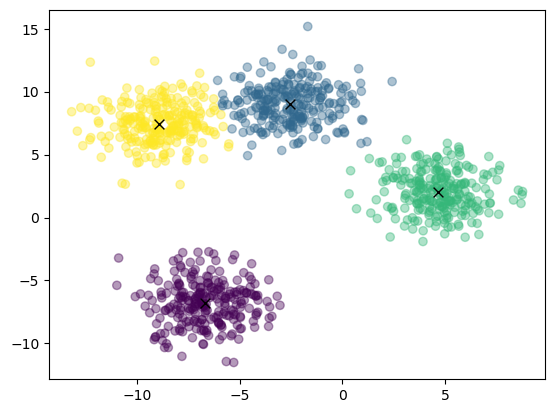

In [273]:
calculo_visualizacion_Kmeans(X, 4)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado. 
</div>

Después de ajustar el modelo de KMeans con k=4 y predecir los grupos, se puede ver en la visualización de los grupos que cada uno de los 4 centroides (centros de los clusters) ha capturado una parte de los datos y se han formado 4 grupos distintos en función de la cercanía de los puntos a cada uno de los centroides.

La elección de k=4 se basa en la curva del codo que muestra que después de 4 clusters, la disminución de la inercia (SSE) es menos significativa, lo que indica que agregar más clusters no mejoraría mucho la agrupación de los datos.

In [274]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
    <strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Moons.
</div>

C:\Users\eduar\miniconda3\envs\uoc20222pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


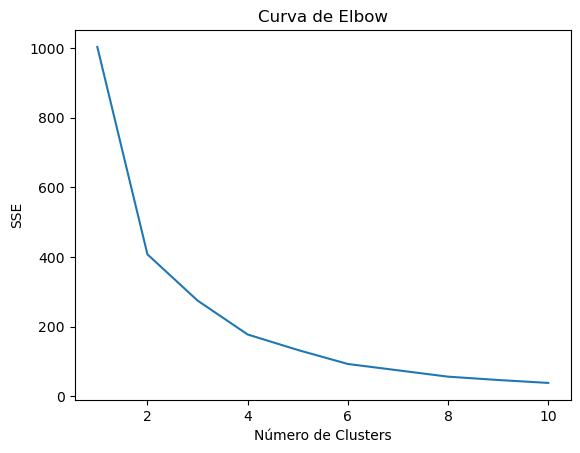

In [275]:
regla_codo(X)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿qué se interpreta en la gráfica?, ¿cómo podría mejorarse la elección de $k$?.  
</div>

La gráfica representa la suma de los errores cuadrados (SSE) para cada valor de k en el rango de 1 al 10. El SSE es una medida de cuánto se separan los puntos de cada centroide en un modelo de KMeans. Como se puede ver en la gráfica, el SSE disminuye a medida que aumenta el número de clusters. Sin embargo, después de k = 2, la disminución en el SSE es menos pronunciada. Esto sugiere que k = 2 es un buen valor para el número de clusters. 

El punto en el que la curva se dobla se conoce como el "codo", que indica el punto donde la ganancia marginal en la reducción del SSE disminuye significativamente. En este caso, el codo se encuentra en k = 2.

Otra manera de abordar la elección de K sería ajustando el valor de K durante la ejecución del algoritmo. Se empieza con un valor y se va modificando durante el proceso, dependiendo de si hay particiones muy cercanas (fusión) o un grupo con alta densidad de elementos (división).

Para mejorar la elección de K, se podría modificar la forma en que agrupamos los elementos para cada cluster. En lugar de utilizar la media, se pueden utilizar:

- K-medians: donde se utiliza la mediana y se evitan los valores atípicos o extremos.
- K-mediods: se fuerza a que los centroides sean elementos del conjunto de datos y es robusto a los valores atípicos y al ruido.
- Fuzzy c-means: cada valor no tiene una relación fija con el grupo al que pertenece (o grupos, ya que pueden pertenecer a varios), sino que tiene un peso de 0 a 1 según su proximidad al centro del grupo.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Moons.
</div>

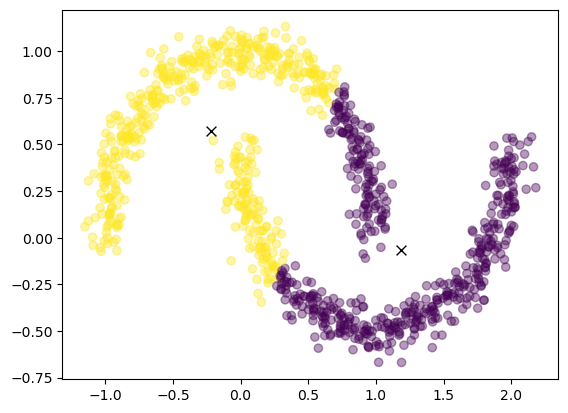

In [276]:
calculo_visualizacion_Kmeans(X, 2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

En la visualización de los grupos resultantes, podemos observar que el modelo KMeans ha agrupado efectivamente los puntos en dos grupos distintos, pero los clústeres funcionan de manera radial usando la distancia euclídea, por lo que no es posible que distinta de una manera correcta las lunas, ya que los puntos de un extremo del arco están más cerca del centroide del otro clúster que del suyo propio.

In [277]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de la regla del codo en el dataset Circles.
</div>

C:\Users\eduar\miniconda3\envs\uoc20222pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


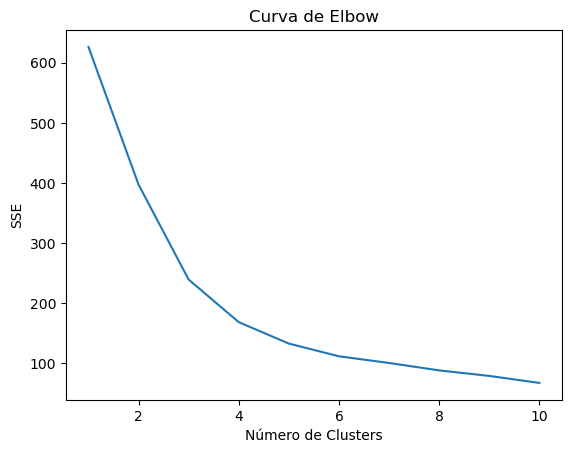

In [278]:
regla_codo(X)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué se interpreta en la gráfica?, ¿cómo podría mejorarse la elección de $k$?.  
</div>

En este caso del conjunto de datos circles, la curva del codo no muestra un codo claro, pero sugiere que el número óptimo de grupos es 2 o 3. Dado que este conjunto de datos se generó con dos círculos, podemos suponer que el número óptimo de grupos es 2.

Un motivo por lo que no se muestra de una manera clara puede deberse a la complejidad de la estructura de los datos o a la naturaleza aleatoria de la generación del conjunto de datos.

Otra manera de abordar la elección de K sería ajustando el valor de K durante la ejecución del algoritmo. Se empieza con un valor y se va modificando durante el proceso, dependiendo de si hay particiones muy cercanas (fusión) o un grupo con alta densidad de elementos (división).

Para mejorar la elección de K, se podría modificar la forma en que agrupamos los elementos para cada cluster. En lugar de utilizar la media, se pueden utilizar:

- K-medians: donde se utiliza la mediana y se evitan los valores atípicos o extremos.
- K-mediods: se fuerza a que los centroides sean elementos del conjunto de datos y es robusto a los valores atípicos y al ruido.
- Fuzzy c-means: cada valor no tiene una relación fija con el grupo al que pertenece (o grupos, ya que pueden pertenecer a varios), sino que tiene un peso de 0 a 1 según su proximidad al centro del grupo.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> cálculo y visualización de los grupos en el dataset Circles.
</div>

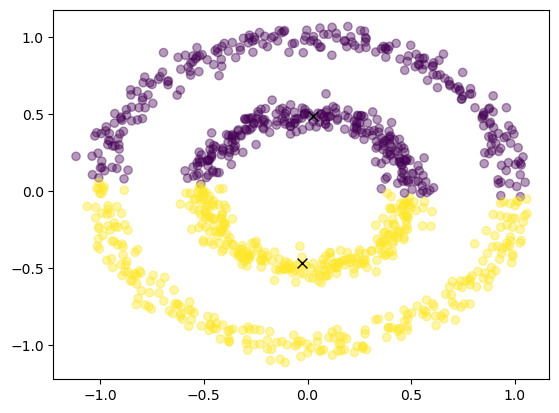

In [279]:
calculo_visualizacion_Kmeans(X, 2)

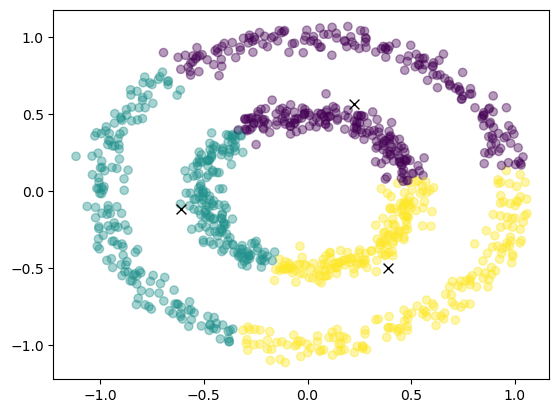

In [280]:
calculo_visualizacion_Kmeans(X, 3)

C:\Users\eduar\miniconda3\envs\uoc20222pec2\lib\site-packages\sklearn\cluster\_kmeans.py:881: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=4.
  warnings.warn(


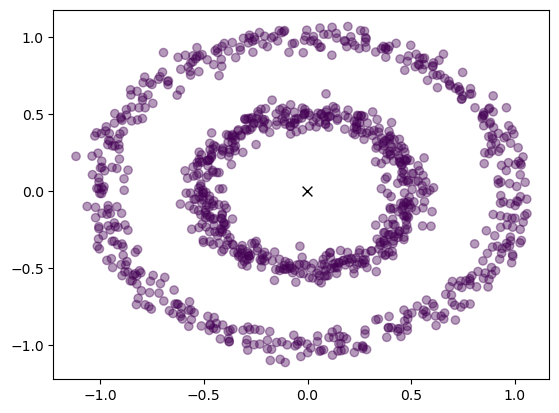

In [281]:
calculo_visualizacion_Kmeans(X, 1)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Tras probar con distintos valores de K, y siguiendo la explicación dada en el caso anterior, el algoritmo de k-means funciona de forma radial, por lo que en este caso el único valor de K que obtendrá un buen agrupamiento es con k=1, el resto de los casos seria como el caso anterior.

### 1 b. Algoritmos basados en densidad: DBSCAN

En este apartado se pide aplicar clustering por densidad como [DBSCAN](https://en.wikipedia.org/wiki/DBSCAN) a los datasets anteriores para detectar los dos grupos subyacentes.

Ésta es una visualización intuitiva de su funcionamiento: https://www.youtube.com/watch?v=RDZUdRSDOok

In [282]:
X, y = X_blobs, y_blobs

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="http://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html">DBSCAN en scikit-learn</a> jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Blobs.
</div>

In [283]:
def calculo_visualizacion_dbscan(X, eps, min_sample):
    
    model = cluster.DBSCAN(eps=eps, min_samples=min_sample, n_jobs=-1)
    clusters = model.fit(X)

    fig, ax = plt.subplots(1, 1)
    ax.scatter(X[:,0], X[:,1], c=clusters.labels_, alpha=.5)
    plt.tight_layout()

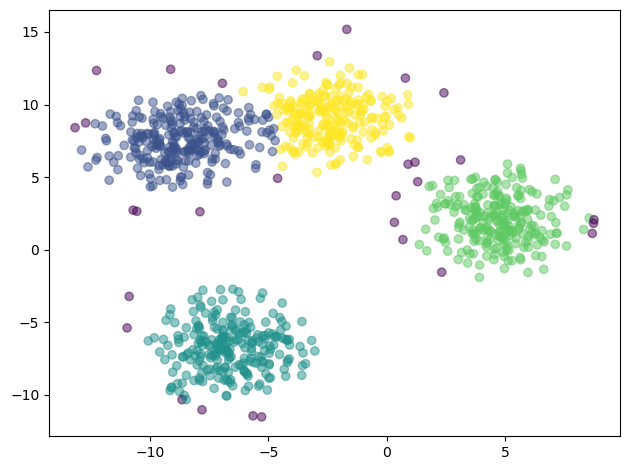

In [284]:
calculo_visualizacion_dbscan(X,2.25,100)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Tras ejecutar varias veces el algoritmo DBSCAN con distintos eps, nos damos cuenta de que con un eps= 2.25 y un min_sample de 100, se consigue identificar los 4 clustres. El motivo por que se ha conseguido este resultado es porque se ha alcanzado un buen nivel de densidad dentro de sus centros.

In [285]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBSCAN jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Moons.
</div>

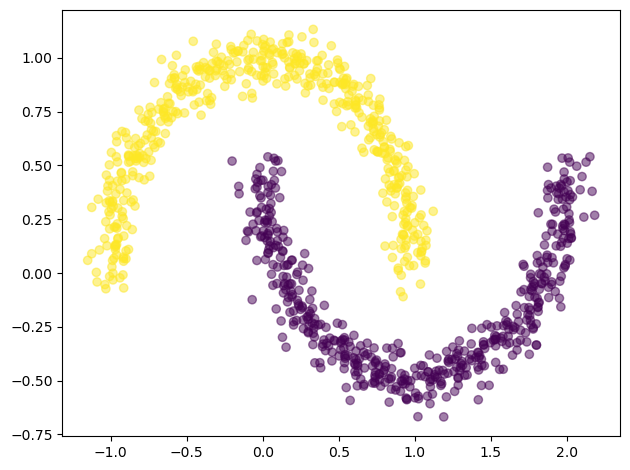

In [286]:
calculo_visualizacion_dbscan(X,0.2,10)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Al utilizar el algoritmo DBSCAN con varios valores de eps, nos damos cuenta de que con un eps de 0.2 y un min_sample de 10, se consigue identificar de una manera clara las dos lunas, esto se debe a que los puntos de cada una de las lunas están lo suficientemente compactados para formar dos estructuras muy densas y separadas que sean fáciles de identificar.

In [287]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de DBScan jugando con los parámetros <i>eps</i> y <i>min_samples</i> para encontrar los grupos (y <i>outliers</i>) del dataset Circles.
</div>

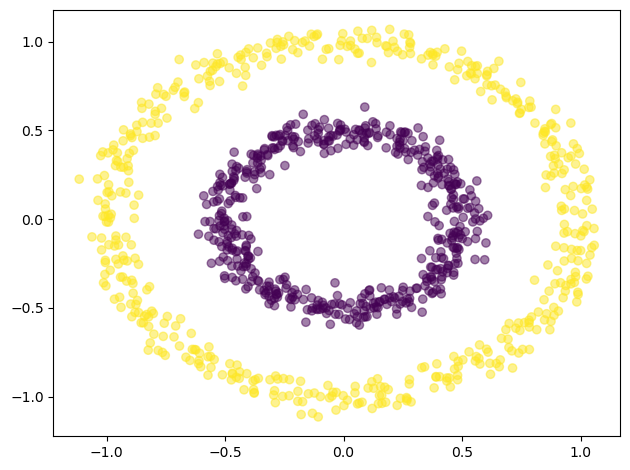

In [288]:
calculo_visualizacion_dbscan(X,0.15,20)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿Qué ha sucedido? Explica los motivos por los que crees que se ha producido ese resultado.  
</div>

Al utilizar el algoritmo DBSCAN con varios valores de eps, nos damos cuenta de que con un eps de 0.15 y un min_sample de 20, se consigue identificar de una manera clara los dos círculos, esto se debe a lo ocurrido en el caso anterior, que los puntos de cada uno de los círculos están lo suficientemente compactados para formar dos estructuras muy densas y separadas que sean fáciles de identificar.

### 1 c. Algoritmos jerárquicos

En este apartado se pide visualizar mediante un [dendrograma](https://en.wikipedia.org/wiki/Dendrogram) la construcción progresiva de los grupos mediante un algoritmo jerárquico aglomerativo (estrategia *bottom-up*). Con ello se pretende encontrar un método gráfico para entender el comportamiento del algoritmo y encontrar los *clusters* deseados en cada dataset.

In [307]:
X, y = X_blobs, y_blobs

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Blobs.<br>
Puedes importar las librerías necesarias para ello.
</div>

In [316]:
def algoritmo_jerarquicos(datos, link, threshold, n_clusters):
    fig, axs = plt.subplots(1, 2, figsize=(20, 10))
    
    # Ejecutamos el algoritmo de clustering
    hcluster = linkage(datos, link)

    # Generamos el dendograma
    dendrogram(
        hcluster,
        ax=axs[0],
        color_threshold=threshold
    )

    axs[0].set_title("Dendrograma")
    axs[0].set_xlabel("Elementos")
    axs[0].set_ylabel("Distancia")
    
    # Aplicamos el árbol generado a los elementos del dataset
    ctree = cut_tree(hcluster, n_clusters)
    axs[1].scatter(datos[:, 0], datos[:, 1], c=ctree, cmap="plasma")
    axs[1].set_title("Dispersión")

    plt.show()


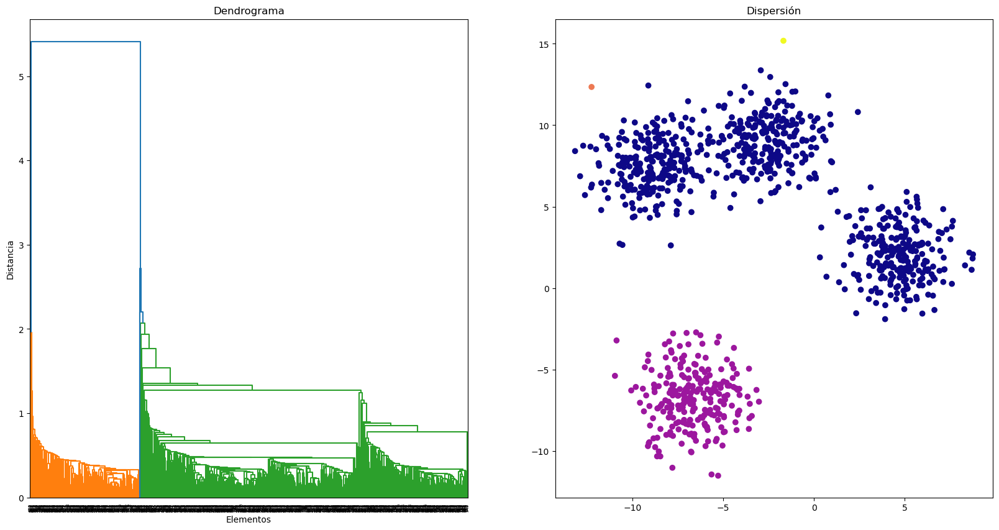

In [309]:
algoritmo_jerarquicos(X,'single',2.2,4)

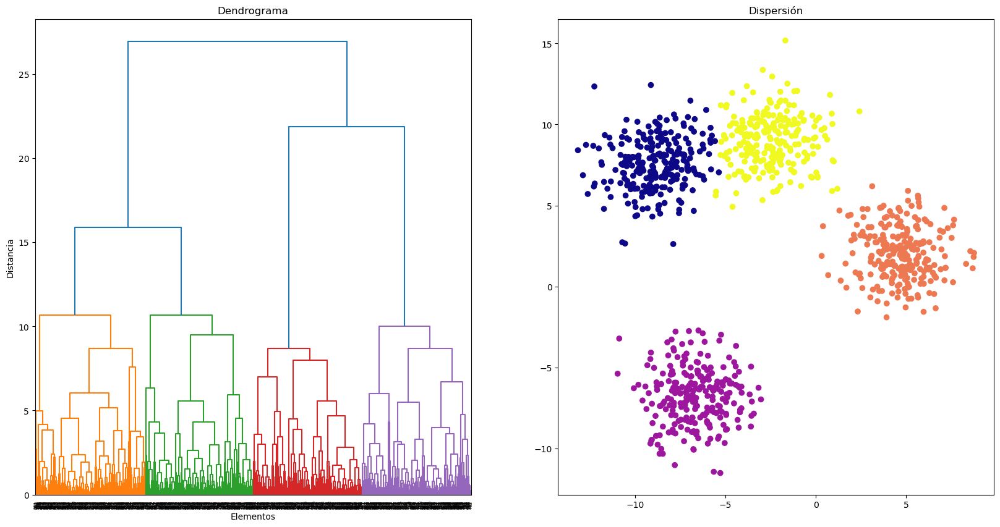

In [310]:
algoritmo_jerarquicos(X,'complete',12,4)

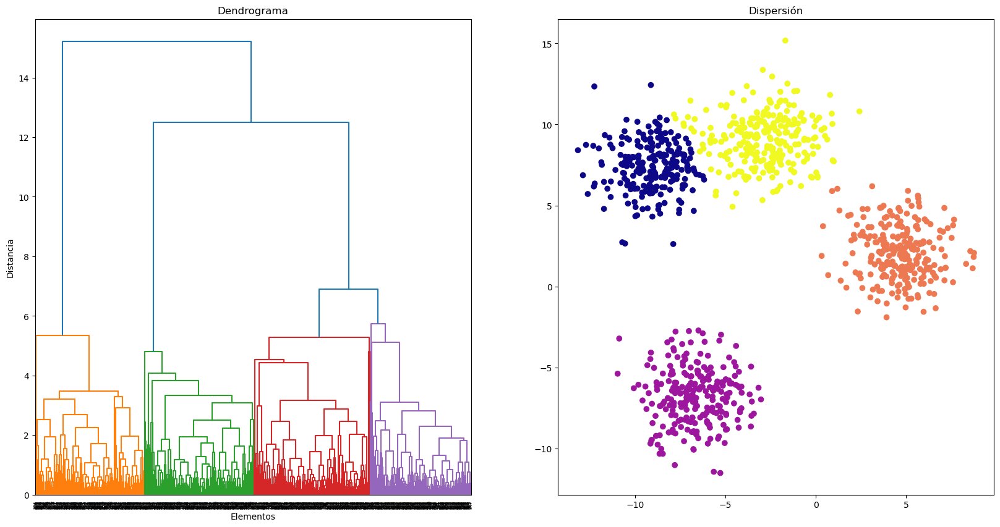

In [311]:
algoritmo_jerarquicos(X,'average', 6,4)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Observando los gráficos, podemos notar que al utilizar el enlace simple, al trabajar con las distancias mínimas, los elementos cercanos de un cluster pueden mezclarse con los de otro, lo que produce un efecto cadena y dificulta la identificación de los clusters más cercanos. Sin embargo, si nos enfocamos en el dendrograma y las distancias, podemos deducir que hay dos clusters claramente definidos.

Por otro lado, al utilizar el enlace completo, se produce una mejora considerable en la identificación de los cuatro clusters, ya que se logra separar de manera más efectiva a los elementos de cada grupo. En este caso, la distancia se mide como la máxima entre los elementos de los clusters, evitando así el efecto cadena.

El enlace average es similar al completo en su forma de agrupar los elementos en clusters.

In [313]:
X, y = X_moons, y_moons

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Moons.<br>
Puedes importar las librerías necesarias para ello.
</div>

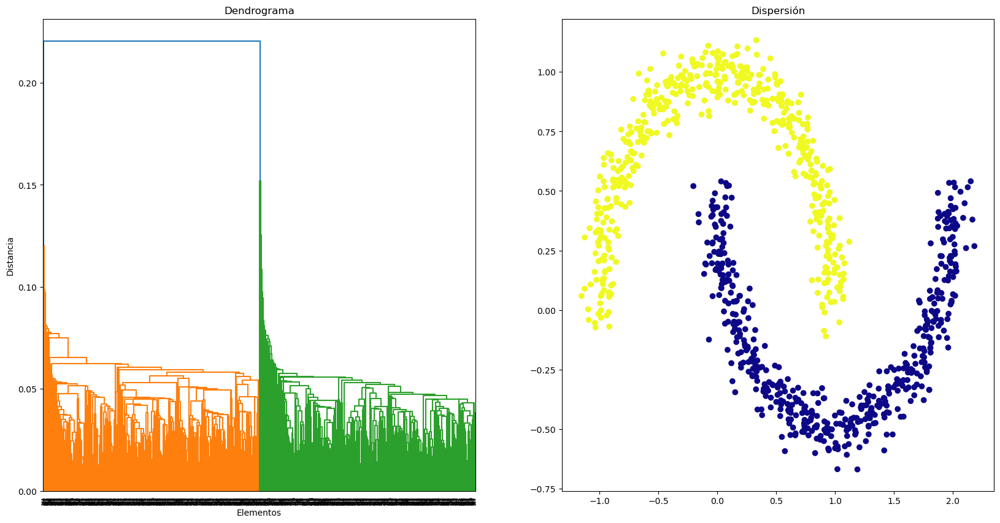

In [317]:
algoritmo_jerarquicos(X,'single',0.2,2)

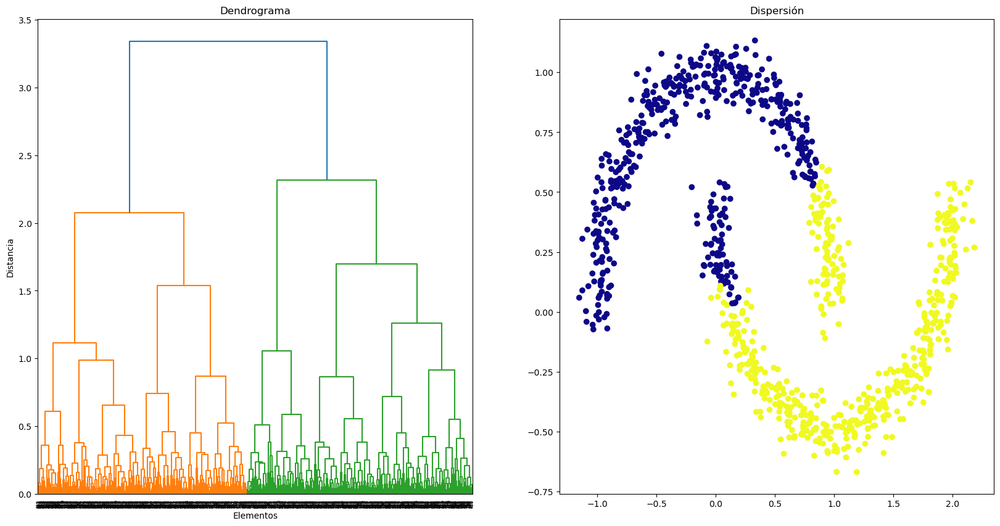

In [318]:
algoritmo_jerarquicos(X,'complete',2.5,2)

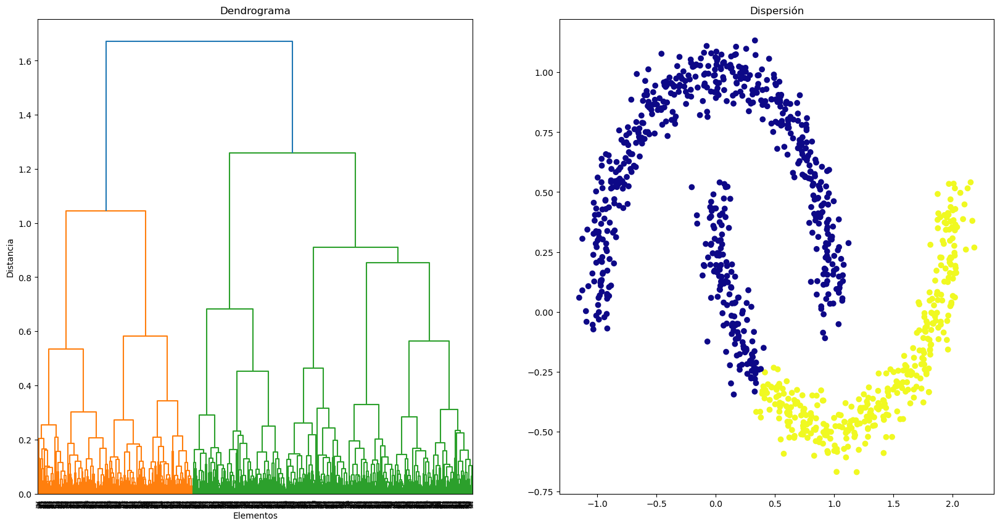

In [319]:
algoritmo_jerarquicos(X,'average',1.4,2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

El enlace simple es eficaz porque trabaja de manera similar al algoritmo de densidad DBSCAN. Al utilizar las distancias mínimas entre elementos de los clusters, se pueden diferenciar dos clusters claramente en el dendrograma. Las distancias entre las líneas hasta formar un tercer cluster son muy largas.

Por otro lado, el enlace completo presenta problemas similares al algoritmo k-means con el dataset moon. Mezcla elementos de un cluster con los del otro al tomar la distancia máxima entre los elementos de los clusters.

El enlace average funciona con la media de las distancias, pero no produce buenos resultados. A veces toma elementos del otro cluster cuando la media es lo suficientemente alta para acceder a los elementos del cluster vecino.

In [320]:
X, y = X_circles, y_circles

<div class="alert alert-block alert-info">
<strong>Implementación:</strong>
prueba la implementación de <a href="https://docs.scipy.org/doc/scipy/reference/cluster.hierarchy.html">clustering jerárquico de scipy</a> probando distintos <a href="https://en.wikipedia.org/wiki/Hierarchical_clustering#Linkage_criteria">criterios de enlace o <i>linkage</i></a> permitiendo identificar los clusters subyacentes (mostrando su resultado) y su dendrograma para el dataset Circles.<br>
Puedes importar las librerías necesarias para ello.
</div>

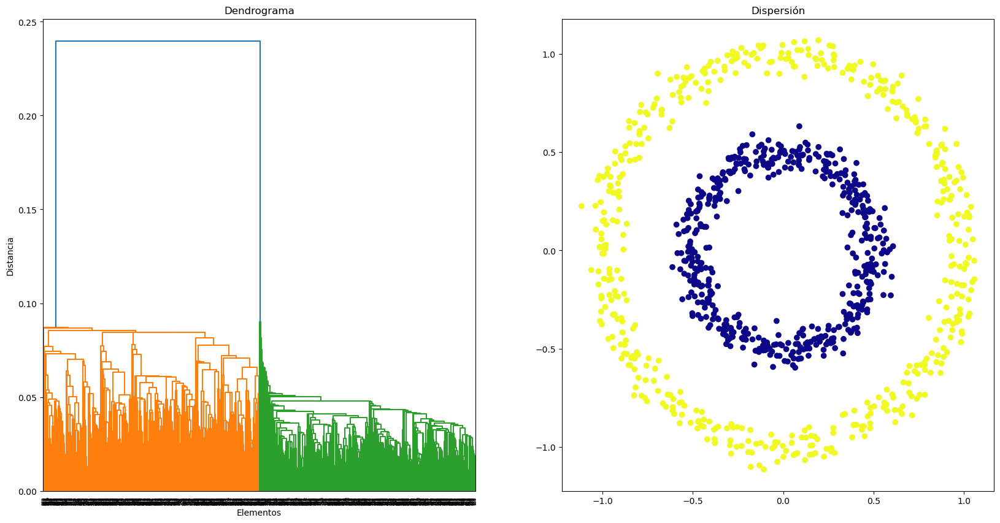

In [321]:
algoritmo_jerarquicos(X,'single',0.15,2)

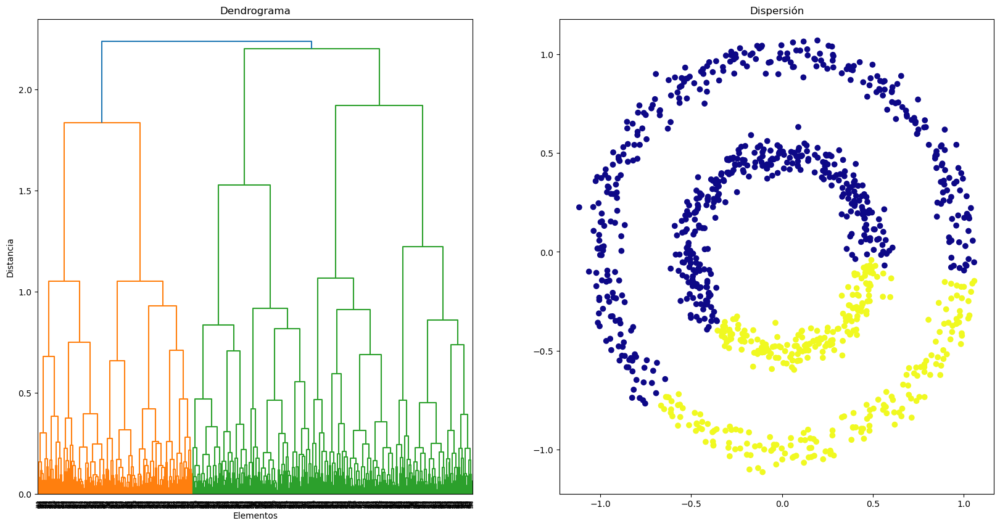

In [322]:
algoritmo_jerarquicos(X,'complete',2.2,2)

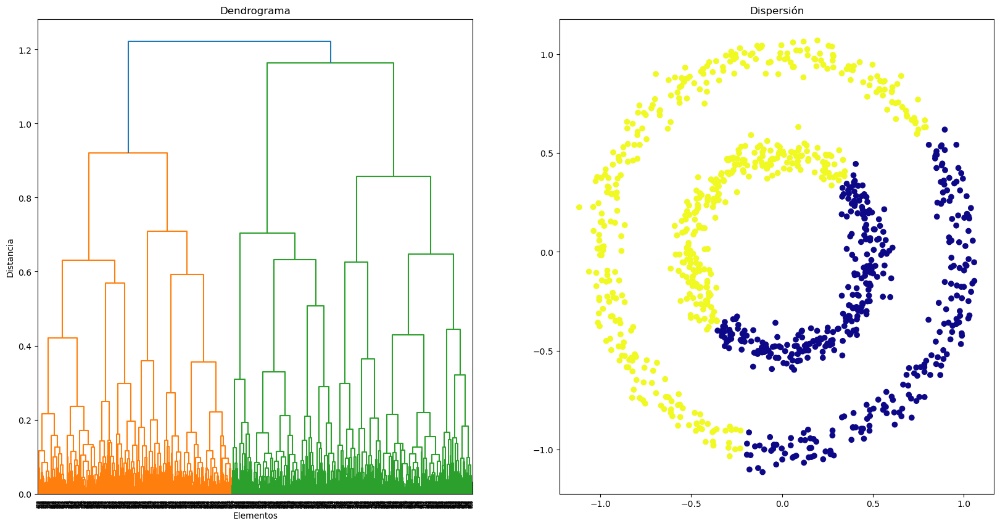

In [323]:
algoritmo_jerarquicos(X,'average',1.2,2)

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> Interpreta el dendrograma y comenta qué criterio de enlace se ha comportado mejor. ¿Por qué?
</div>

Este caso es muy parecido al ejemplo anterior con el dataset moons. En el enlace simple ha funcionado adecuadamente, logrando separar los clusters de forma precisa. Sin embargo, el enlace completo presenta el mismo problema que en el dataset moons, mezclando elementos entre los clusters y sin una clara distinción de clusters en el dendograma. El enlace average tampoco es efectivo, debido a que su distancia para medir la relación entre los clusters funciona peor y también mezcla elementos entre los clusters.

<a id="ej2"></a>

## 2. Aplicación para comprimir imágenes (3 puntos)

Las imágenes en color se componen de píxeles que tienen tres componentes (roja, azul y verde), destinando 1 *byte* a cada canal. Pudiendo representar $2^8 = 256$ rojos, verdes y azules. Con un total de $2^{8^{3}} = 2^{24} = 16777216$ colores representables en cada píxel.

Entre mayor sea el número de colores representables, más memoria será necesaria para almacenar la imagen.
Por tanto, una estrategia para comprimir una imagen puede ser disminuir los colores representables en cada píxel, necesitando menos *bits* para guardar el valor de un píxel. Este método no es reversible, es decir, no se puede volver a recuperar la imagen original a partir de la comprimida. Por tanto, este tipo de compresiónse denomina [comprensión con pérdidas](https://es.wikipedia.org/wiki/Algoritmo_de_compresi%C3%B3n_con_p%C3%A9rdida).

Pero ¿cómo seleccionamos los "píxeles parecidos" en la imagen original y determinamos su color en la imagen comprimida?. Una opción es utilizar *k-means* donde **$k$ será el número de colores representables**, los puntos que pertenecen a cada cluster equivaldrían a los "píxeles parecidos" y las coordenadas de los **centroides actuarán como los colores finales** a los que se aproximarán los "píxeles parecidos".

Como resultado del clustering, se obtiene una paleta de colores reducida (coordenadas de los centroides) donde cada píxel de la imagen hará referencia a uno de estos colores (cluster al que pertenece). El uso de paletas de colores o [colores indexados](https://en.wikipedia.org/wiki/Indexed_color) es un recurso empleado por distintos formatos de imagen como *PNG*, *GIF* o *TIFF*.

Si no dispones de la librería ``skimage`` puedes instalarla:
 - Usando conda (si has creado tu entorno virtual con conda): ``conda install scikit-image``
 - Usando pip: ``pip install scikit-image``

Imagen con 65536 pixeles (196608 bytes)


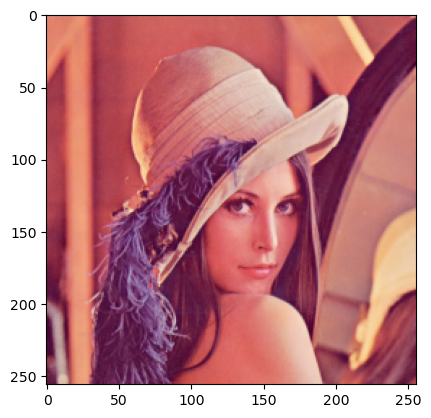

In [324]:
from skimage import io, transform

photo = (transform.resize(
    io.imread('https://upload.wikimedia.org/wikipedia/en/7/7d/Lenna_%28test_image%29.png'),
    (256, 256), mode='edge') * 255).astype(np.uint8)
plt.imshow(photo)        # np.array con shape (256, 256, 3), alto por ancho por 3 (los tres canales: rojo, verde y azul), donde cada valor ocupa un byte.
X = photo.reshape(-1, 3) # np.array con shape (65536, 3), cada pixel con sus 3 canales
print('Imagen con {} pixeles ({} bytes)'.format(X.shape[0], X.shape[0] * 3))

Para facilitar la tarea, la imagen anterior está guardada en un *array* con tantas filas como píxeles y columnas como canales (rojo, verde y azul). De forma que cada "muestra" equivale al valor de un píxel.

Se puede volver a recomponer la imagen original con:
```
plt.imshow(X.reshape(photo.shape))
```
Podemos ver cada píxel como un punto en un sistema de coordenadas de 3 dimensiones donde una es su cantidad de rojo, otra su cantidad de verde y por último su cantidad de azul. Por lo que podemos realizar una visualización en 3 dimensiones de los píxeles sobre la que se probará el algoritmo de clustering:

In [325]:
X

array([[225, 136, 125],
       [223, 136, 129],
       [225, 133, 118],
       ...,
       [166,  69,  84],
       [177,  68,  78],
       [182,  72,  80]], dtype=uint8)

Para visualizar la animación de la representación 3D de los píxeles es necesario instalar la librería ``ffmpeg``.

Si tienes un entorno virtual de conda, lo puedes instalar con: ``conda install -c conda-forge ffmpeg``.

**Si tienes un error**, puedes ver una representación estática 2 celdas más adelante.

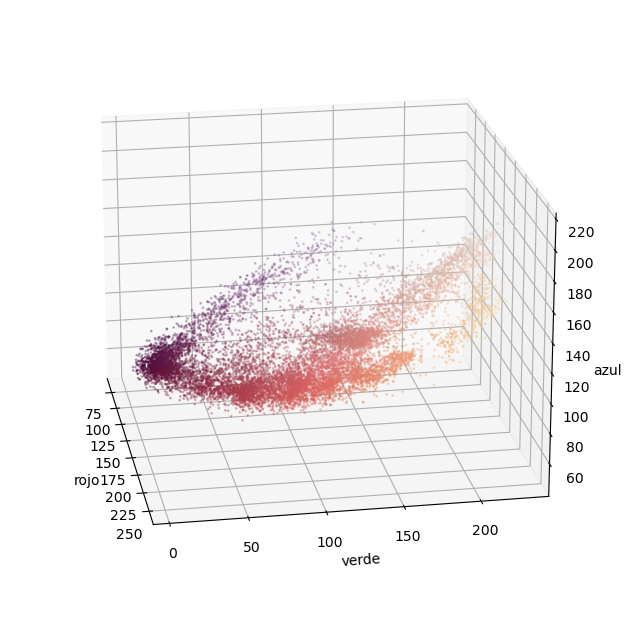

In [326]:
from matplotlib import animation
from mpl_toolkits.mplot3d import Axes3D

matplotlib.rcParams['animation.html'] = 'html5'

idx = np.random.randint(X.shape[0], size=int(X.shape[0] * .2))
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig)
ax.scatter(X[idx,0], X[idx,1], X[idx,2], s=1, c=X[idx,:] / 255, alpha=.3)
ax.set_xlabel('rojo')
ax.set_ylabel('verde')
ax.set_zlabel('azul')

def animate(i):
    ax.view_init(elev=20., azim=i)
    return fig,

anim = animation.FuncAnimation(fig, animate, frames=range(0, 360, 10), interval=200, blit=True)
anim

Visualización estática del valor de los píxeles:

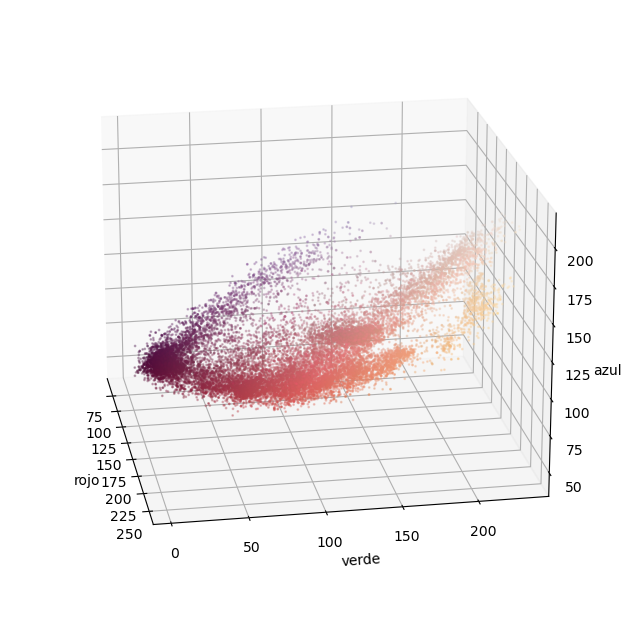

In [327]:
idx = np.random.randint(X.shape[0], size=int(X.shape[0] * .3))
fig = plt.figure(figsize=(8, 6))
ax = Axes3D(fig)
ax.scatter(X[idx,0], X[idx,1], X[idx,2], s=1, c=X[idx,:] / 255, alpha=.3)
ax.set_xlabel('rojo')
ax.set_ylabel('verde')
ax.set_zlabel('azul')
ax.view_init(20, 350)
plt.show()

En la visualización anterior se ha representado cada píxel con su color, donde sus coordenadas en los 3 colores oscilan entre 0 (carece de esa componente) y 1. Podemos comprobar como los píxeles en coordenadas (255, 255, 255) son píxeles blancos y los situados en (0, 0, 0) son píxeles negros. También se observan 4 estructuras de píxeles: la pluma del sombrero, el sombrero, la piel de la modelo (Lenna) y el fondo.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> aplicar <i>k-means</i> con <i>k=3</i> a los píxeles de la imagen (puntos con 3 dimensiones de la variable <i>X</i>) y obtener, para cada punto, su centroide más cercano. Y las coordenadas (3 dimensiones) de cada centroide.
</div>

In [328]:
# aplicar k-means con k=3
kmeans = KMeans(n_clusters=3, random_state=0).fit(X)

# obtener etiquetas para cada punto
labels = kmeans.labels_

# obtener centroides
centroids = kmeans.cluster_centers_

# imprimir coordenadas de centroides
print('Coordenadas de centroides:')
for i in range(3):
    print(f'Centroide {i}: {centroids[i]}')

Coordenadas de centroides:
Centroide 0: [192.79369528  94.6089138   98.92674487]
Centroide 1: [223.32396557 161.71684123 142.90423105]
Centroide 2: [109.49489943  34.90801683  72.64117342]


<div class="alert alert-block alert-info">
<strong>Implementación:</strong> asgina a cada punto (píxel de la imagen) el valor de su centroide asociado en lugar de su propio valor.
</div>

In [329]:
# asignar a cada punto el centroide más cercano
X_clustered = np.array([centroids[label] for label in labels])

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> volver a convertir el resultado en una imagen usando la función <i>reshape</i> (como cuando se creó X) para que vuelva a tener su dimensión de <i>256 x 256</i>. Y mostrarla con <i>imshow</i>.
</div>

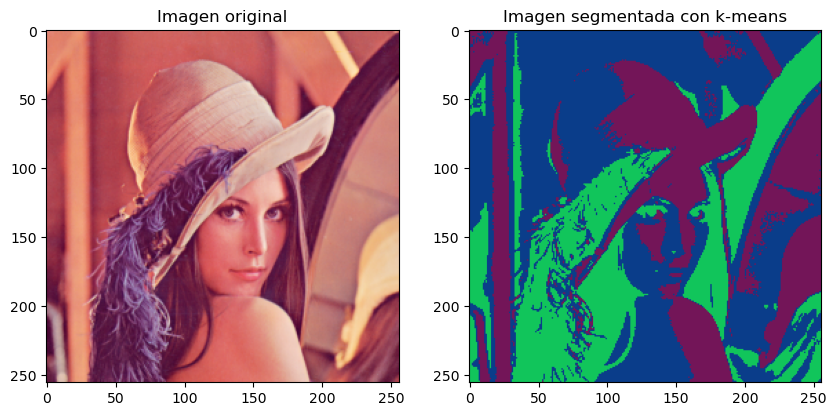

In [330]:
# redimensionar matriz a la forma original de la imagen
X_clustered = X_clustered.reshape(img_norm.shape)

# crear imagen a partir de la matriz de píxeles
img_clustered = Image.fromarray(np.uint8(X_clustered*255))

# mostrar imagen original y segmentada
fig, axs = plt.subplots(1, 2, figsize=(10, 5))
axs[0].imshow(photo)
axs[0].set_title('Imagen original')
axs[1].imshow(img_clustered)
axs[1].set_title('Imagen segmentada con k-means')
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿por qué se ha producido este resultado?, ¿qué relación tiene con el clústering?
</div>

El resultado que se ha producido es una imagen que parece una versión simplificada y suavizada de la imagen original. Esto se debe a que se ha aplicado el algoritmo de clustering K-means a los píxeles de la imagen, donde cada píxel se trata como un punto en un espacio de 3 dimensiones (rojo, verde, azul) y se agrupan en 3 clusters. Luego, se reemplaza el valor de cada píxel con el valor del centroide del cluster al que pertenece, lo que resulta en una imagen con una paleta de colores limitada a los valores de los centros de los clusters.

La relación con el clustering es que el objetivo de este algoritmo es agrupar los datos en grupos (clusters) de manera que los datos dentro de cada grupo sean similares entre sí y diferentes de los datos en otros grupos. En este caso, los datos son los píxeles de la imagen y la similitud se mide en términos de la distancia entre los valores de los píxeles en el espacio de color RGB. El resultado de aplicar K-means a la imagen es una simplificación de la imagen original, ya que se reduce la cantidad de colores en la imagen y se agrupan píxeles similares en los mismos clusters.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> realizar el proceso anterior para distintos valores de <i>k</i>: 256, 128, 64, 32, 16, 8, 4 y 2 colores. Mostrar las imágenes e indicar los bytes que ocuparía cada una de las opciones.
</div>

In [332]:
def show_compressed_image(k):
    # Aplicar k-means
    kmeans = KMeans(n_clusters=k, random_state=0).fit(X)
    labels = kmeans.predict(X)
    centroids = kmeans.cluster_centers_.astype(int)

    # Obtener los valores de los centroides más cercanos para cada punto
    compressed = np.zeros_like(X)
    for i, label in enumerate(labels):
        compressed[i] = centroids[label]

    # Redimensionar y mostrar imágenes
    original = np.reshape(photo, (256, 256, 3))
    compressed = np.reshape(compressed, (256, 256, 3))
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original)
    ax[0].set_title('Original')
    ax[1].imshow(compressed)
    ax[1].set_title(f'{k} colores')
    plt.show()

    # Imprimir tamaño en bytes de la imagen comprimida
    compressed_size = compressed.nbytes
    print(f'Tamaño de la imagen comprimida ({k} colores): {compressed_size} bytes')


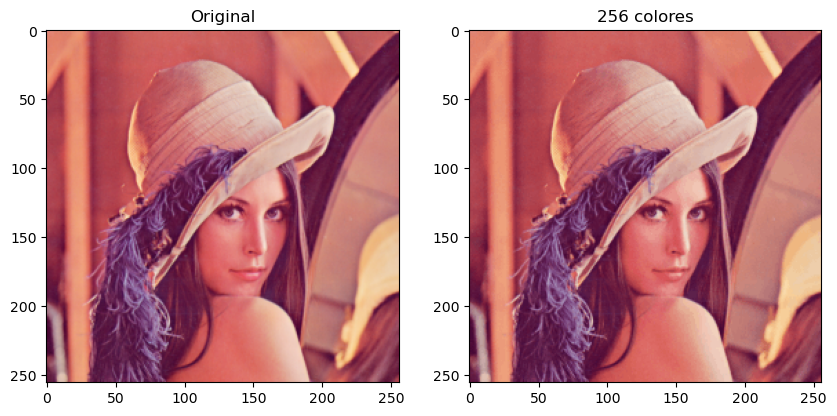

Tamaño de la imagen comprimida (256 colores): 196608 bytes


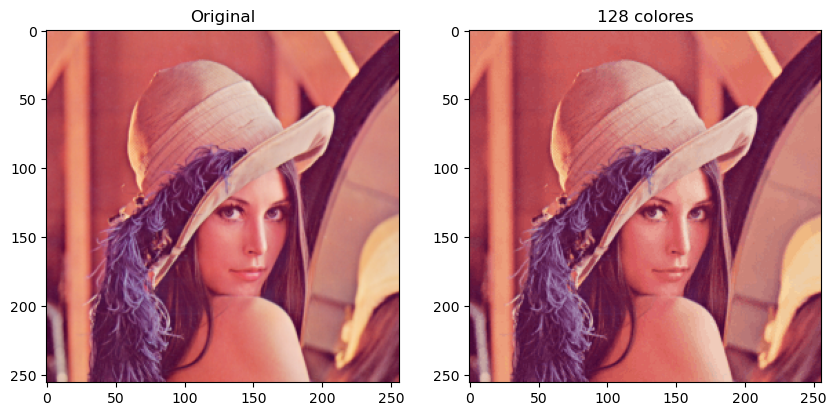

Tamaño de la imagen comprimida (128 colores): 196608 bytes


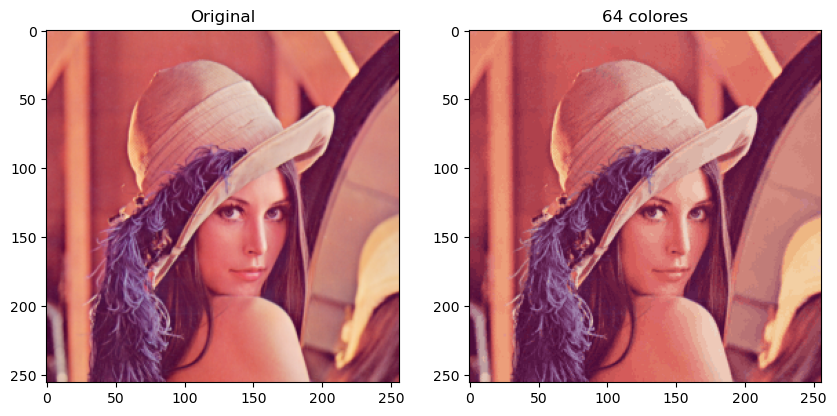

Tamaño de la imagen comprimida (64 colores): 196608 bytes


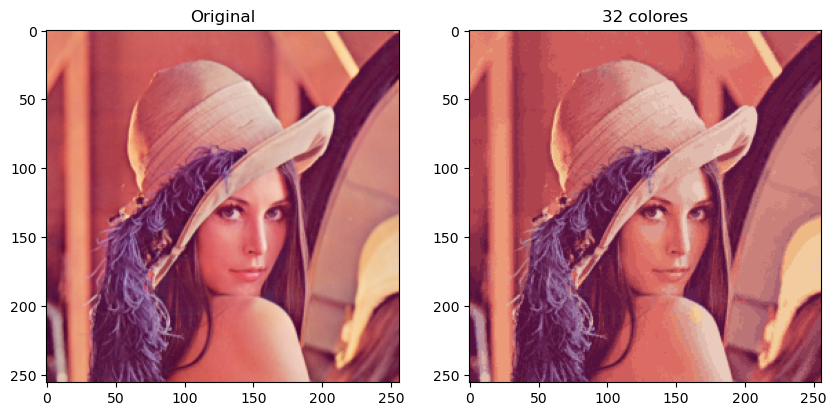

Tamaño de la imagen comprimida (32 colores): 196608 bytes


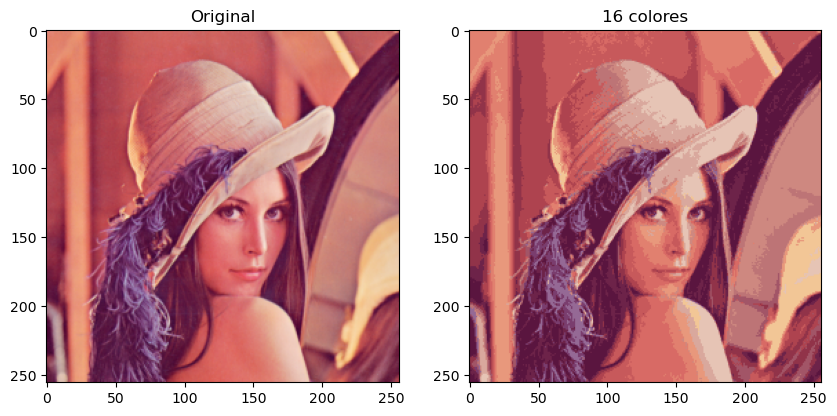

Tamaño de la imagen comprimida (16 colores): 196608 bytes


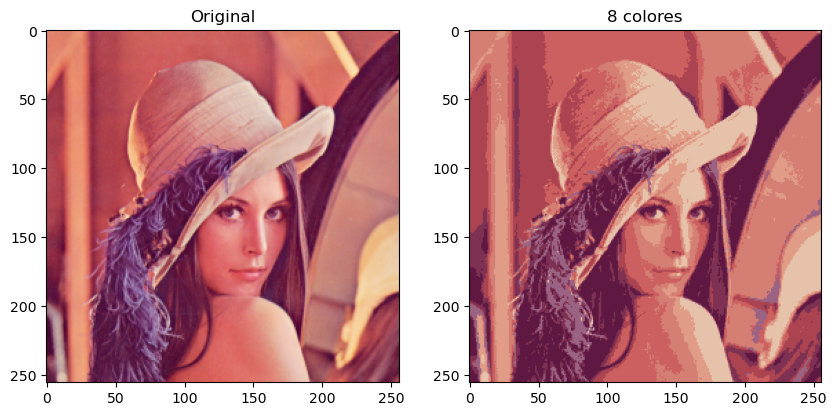

Tamaño de la imagen comprimida (8 colores): 196608 bytes


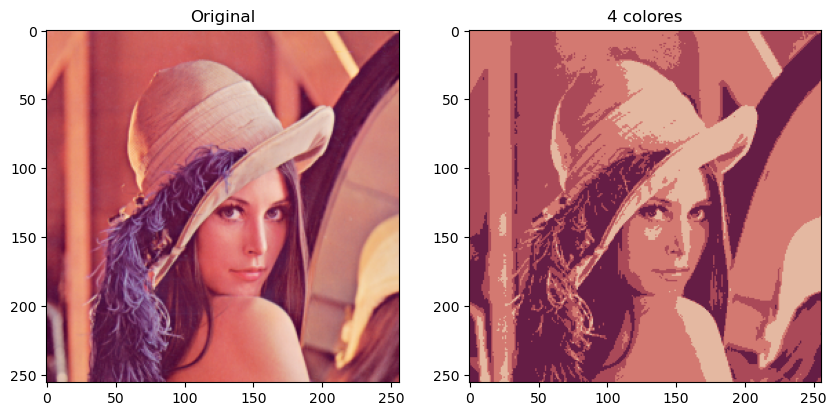

Tamaño de la imagen comprimida (4 colores): 196608 bytes


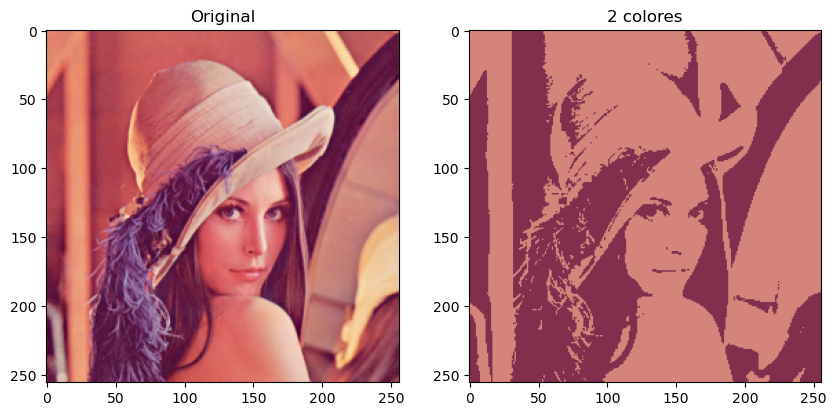

Tamaño de la imagen comprimida (2 colores): 196608 bytes


In [333]:
ks = [256, 128, 64, 32, 16, 8, 4, 2]
for k in ks:
    show_compressed_image(k)

<a id="ej3"></a>

## 3. Aplicación de reducción de dimensionalidad para resolver un problema de optimización: t-SNE (2 puntos)

Como ya se ha visto, el algoritmo [t-SNE](https://en.wikipedia.org/wiki/T-distributed_stochastic_neighbor_embedding) ideado por [van der Maaten y Hinton](https://lvdmaaten.github.io/tsne/) difiere de PCA en que no trata de maximizar la varianza explicada. Intuitivamente, t-SNE trata de que la vecindad de un punto en baja dimensionalidad sea la misma que la original (mantenga las distancias). Partiendo de una localización aleatoria de cada punto, corrige su posición de forma iterativa tratando de minimizar la distancia a sus vecinos originales hasta converger.

Para ello, t-SNE dispone de diversos [parámetros](https://distill.pub/2016/misread-tsne/) que pueden modificar drásticamente el resultado. Por lo que se recomienda conocer su funcionamiento antes de aplicar la técnica.

Partiendo de las distancias entre las [provincias de España](https://www.gifex.com/images/0X0/2009-12-02-11305/Provincias_de_Espana.jpg), presentes en el fichero de datos (en *pec2_3.p* un *DataFrame* de *pandas* en formato *pickle* o *pec2_3.csv* en formato *CSV*). Se pide calcular la matriz cuadrada que contenga la distancia de cada provincia contra las demás.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> la matriz debe tener tantas filas y columnas como provincias. Y cada celda debe contener la distancia entre las provincias de esa fila y columna.
</div>

In [334]:
# Leemos los datos del archivo CSV o pickle en un DataFrame de Pandas
df = pd.read_pickle("pec2_3.p")
#df = pd.read_csv("pec2_3.csv")

# Extraemos las provincias y las ordenamos alfabéticamente
provincias = np.sort(df["from"].unique())

# Calculamos el número de provincias
num_provincias = len(provincias)

# Creamos una matriz cuadrada de tamaño nxn
matriz_distancias = np.zeros((num_provincias, num_provincias))

# Rellenamos la matriz con las distancias entre las provincias
for index, row in df.iterrows():
    from_idx = np.where(provincias == row["from"])[0][0]
    to_idx = np.where(provincias == row["to"])[0][0]
    distancia = row["dist"]
    matriz_distancias[from_idx][to_idx] = distancia
    matriz_distancias[to_idx][from_idx] = distancia

# Imprimimos la matriz de distancias
print(matriz_distancias)

[[  0.         724.85665051 846.21216296 ... 616.47538848 473.05896065
  401.05319304]
 [724.85665051   0.         133.16794528 ... 302.15728323 436.33831708
  326.35771831]
 [846.21216296 133.16794528   0.         ... 343.2373174  506.48555481
  453.16351205]
 ...
 [616.47538848 302.15728323 343.2373174  ...   0.         177.21288026
  327.41004899]
 [473.05896065 436.33831708 506.48555481 ... 177.21288026   0.
  305.02738162]
 [401.05319304 326.35771831 453.16351205 ... 327.41004899 305.02738162
    0.        ]]


Una vez que se cuenta con la matriz de distancias, *t-SNE* tratará de mantener esas distancias entre los distintos puntos en baja dimensionalidad (en este caso 2 dimensiones). Emplazando los puntos en el plano mientras intenta mantener las distancias indicadas.

Dado que la entrada a [*t-SNE*](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html) se le pasa la matriz de distancias, no es necesario que las calcule. Por ello le indicaremos que la métrica a emplear es "precalculada".

Como *t-SNE* es un algoritmo estocástico (dos ejecuciones consecutivas con los mismos datos pueden conducir a resultados diferentes). Se pide realizar el proceso de ajuste con *t-SNE* 100 veces y quedarse con la ejecución con menor error (ver el atributo [*kl_divergence*](https://scikit-learn.org/stable/modules/generated/sklearn.manifold.TSNE.html)).

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> jugar con los hiperparámetros de <i>t-SNE</i>, ejecutar 100 veces el ajuste de <i>t-SNE</i> y guardar el resultado de emplazamiento de provincias en el plano de la ejecución con menor error.
</div>

In [337]:
# Ejecutamos t-SNE 100 veces y guardamos el resultado con menor error
best_tsne = None
best_error = np.inf

for i in range(100):
    # Creamos un objeto TSNE con los hiperparámetros deseados
    tsne = TSNE(n_components=2, metric='precomputed', square_distances=True, random_state=42)

    # Ajustamos t-SNE con la matriz de distancias
    tsne_results = tsne.fit_transform(matriz_distancias)

    # Calculamos el error de Kullback-Leibler (KL) divergence
    error = tsne.kl_divergence_

    # Guardamos el resultado con menor error
    if error < best_error:
        best_tsne = tsne_results
        best_error = error

# Imprimimos el error de la mejor ejecución de t-SNE
print("Mejor error de t-SNE:", best_error)

# Imprimimos los resultados de la mejor ejecución de t-SNE
for i in range(num_provincias):
    print(provincias[i], best_tsne[i])

Mejor error de t-SNE: 0.40686744451522827
A Coruña [ 84.638214 193.1127  ]
Albacete [ 90.963    -23.063398]
Alicante/Alacant [  81.14619  -110.410645]
Almería [-98.77167 129.53607]
Asturias [50.45708  83.174644]
Badajoz [ 12.935295 134.75096 ]
Barcelona [  27.087498 -148.24686 ]
Burgos [-58.56507  -19.260883]
Cantabria [-95.65695 -33.0777 ]
Castellón/Castelló [ -32.974438 -233.42859 ]
Ceuta [-43.15921 211.78429]
Ciudad Real [73.34034 22.97835]
Cuenca [ 48.66921 -43.86587]
Cáceres [-2.7534876 98.27556  ]
Cádiz [144.5609  100.91999]
Córdoba [-38.555992 126.63477 ]
Girona [ -59.26406 -167.85272]
Granada [-63.814045 162.73671 ]
Guadalajara [  4.2636924 -44.744133 ]
Guipúzcoa [-48.43498 -60.25753]
Huelva [-13.681447 167.54996 ]
Huesca [ -16.470015 -130.08734 ]
Illes Balears [  75.30367 -171.79231]
Jaén [121.11156   19.261713]
La Rioja [-81.34848 -77.02258]
León [-87.89148   58.168003]
Lleida [ -11.813114 -172.79128 ]
Lugo [ 77.962654 116.00556 ]
Madrid [20.655859  -6.0961366]
Melilla [-100.

Una vez que se tienen las posiciones de las provincias en el plano, visualizar el resultado y analizar si el emplazamiento de las provincias calculado por *t-SNE* calculado en base a las distancias se parece al real.

<div class="alert alert-block alert-info">
<strong>Implementación:</strong> visualizar en un <i>scatter</i> las provincias de la ejecución con menor error, junto con su nombre para poder analizarlo.
</div>

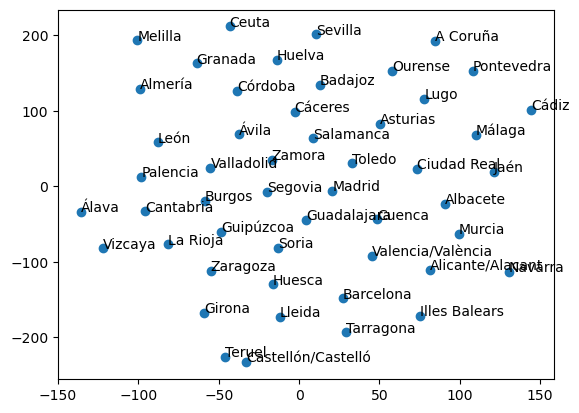

In [338]:
# Obtenemos las coordenadas X e Y de las provincias
x_coords = best_tsne[:, 0]
y_coords = best_tsne[:, 1]

# Creamos la figura
fig, ax = plt.subplots()

# Graficamos las provincias
ax.scatter(x_coords, y_coords)

# Agregamos el nombre de cada provincia
for i in range(num_provincias):
    ax.annotate(provincias[i], (x_coords[i], y_coords[i]))

# Mostramos la figura
plt.show()

<div class="alert alert-block alert-info">
<strong>Análisis:</strong> ¿se parece a la distribución de provincias real?, ¿por qué?
</div>

La distribución de provincias obtenida por t-SNE se parece a la distribución real en términos generales, aunque no es una representación exacta de la misma. Por un lado, se pueden identificar algunas agrupaciones de provincias que están cerca en la realidad, como las provincias de Andalucía o las de la costa mediterránea. Por otro lado, hay algunas provincias que se encuentran más alejadas de su ubicación real, como puede ser el caso de las provincias insulares o las de las regiones más alejadas del centro de la península.

La razón por la que t-SNE no reproduce exactamente la distribución de provincias real se debe a que es un algoritmo que busca representar las distancias entre los puntos en una dimensión reducida, tratando de mantener las distancias lo mejor posible. Pero en un espacio de dos dimensiones, es difícil mantener todas las distancias exactamente iguales, por lo que algunas provincias pueden aparecer más alejadas de lo que realmente están. Además, como se trata de un algoritmo estocástico, los resultados pueden variar ligeramente entre diferentes ejecuciones, lo que también puede afectar a la apariencia final de la visualización.